In [1]:
import numpy as np
import pandas as pd

We want to demonstrate the fact that linear functionals on the signature can arbitrarily approximate functions on path-space i.e. technical indicators!

First we define our indicators from the book

In [2]:
def ClassicalIndicator(price_series, indicator, parameters):
    '''
    MA: parameters = [n]
    
    EMA: parameters = [n]
    
    BB: parameters = [n, K] (Bollinger Bands)
    
    MACD: parameters = [m, n, k] (m < n)
    '''
    if indicator == 'MA':   
        n = parameters[0]
        
        return price_series.rolling(min_periods=n, window=n).mean()
    
    if indicator == 'EMA':
        n = parameters[0]
        ret = price_series.ewm(span=n, adjust=False).mean()
        ret.iloc[:n-1] = pd.NA
        
        return ret
    
    if indicator == 'BB':
        n, K = parameters
        
        EMA = ClassicalIndicator(price_series, 'EMA', [n])
        
        std = price_series.rolling(min_periods=n, window=n).std() 
        
        Upper = EMA + K*std
        Lower = EMA - K*std
        
        return Upper, Lower
        
    if indicator == 'MACD':
        m, n, k = parameters
        
        MACD = ClassicalIndicator(price_series, 'EMA', [m]) - ClassicalIndicator(price_series, 'EMA', [n])
        DEA = ClassicalIndicator(MACD, 'EMA', [k])
        
        return MACD - DEA
        
    if indicator == 'ROC':
        n = parameters[0]        
        
        return (price_series - price_series.shift(n))/price_series.shift(n)
    
    if indicator == 'RSI':
        n = parameters[0]
        delta = price_series.diff()

        # Indicator functions: 1 if price increase, 0 otherwise
        up_moves = delta.where(delta > 0, 0)
        down_moves = -delta.where(delta < 0, 0)

        # Compute rolling average of up and down moves
        avg_up = up_moves.rolling(window=n, min_periods=n).mean()
        avg_down = down_moves.rolling(window=n, min_periods=n).mean()

        # Compute Relative Strength (RS)
        rs = avg_up / avg_down.replace(0, np.nan)  # Avoid division by zero
        
        rsi = 100*(rs/(1+rs))
        
        return rsi

In [3]:
def StationarisedIndicator(price_series, indicator, parameters):
    '''
    Based on HFT-Wang-Zheng X(n, t)
    
    n=1) MA: parameters = [n]
    
    n=2) EMA: parameters = [n]
    
    n=3) BB: parameters = [n]
    
    n=4) MACD: parameters = [m, n, k] (m < n)
    
    n=5) ROC: parameters = [n]
    
    n=6) RSI: parameters = [n]
    
    '''
    if indicator == 'MA':
        return ClassicalIndicator(price_series, 'MA', parameters)/price_series
    
    if indicator == 'EMA':
        return ClassicalIndicator(price_series, 'EMA', parameters)/price_series
    
    if indicator == 'BB':
        n = parameters[0]
        
        EMA = ClassicalIndicator(price_series, 'EMA', [n])        
        std = price_series.ewm(span=n, adjust=False).std() 
        
        return (price_series - EMA)/std
    
    if indicator == 'MACD':
        m, n, k = parameters
        
        MACD_hist = ClassicalIndicator(price_series, 'MACD', parameters)
        return MACD_hist/price_series.shift(n+k)
    
    if indicator == 'ROC':
        return ClassicalIndicator(price_series, 'ROC', parameters)
    
    if indicator == 'RSI':
        return ClassicalIndicator(price_series, 'RSI', parameters)


Then we generate synthetic timeseries X_t to then apply the indicators to to create Y_t (one for each indicator)

In [4]:
import matplotlib.pyplot as plt

def geometric_brownian_motion(N, T, dt, S0, mu, sigma):
    """
    Simulates N trajectories of Geometric Brownian Motion (GBM).

    Parameters:
    - N: int, number of trajectories
    - T: float, total time period
    - dt: float, time step size
    - S0: float, initial asset price
    - mu: float, drift (expected return)
    - sigma: float, volatility

    Returns:
    - t: array, time points
    - S: array, simulated GBM paths (shape: N x time steps)
    """
    num_steps = int(T / dt)  # Number of time steps
    t = np.linspace(0, T, num_steps)  # Time grid
    
    # Generate random increments for Brownian motion
    dW = np.random.normal(0, np.sqrt(dt), size=(N, num_steps-1))

    # Compute log returns and simulate price paths
    S = np.zeros((N, num_steps))
    S[:, 0] = S0  # Set initial price
    
    for i in range(1, num_steps):
        S[:, i] = S[:, i-1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW[:, i-1])

    return t, S

In [5]:
def CreateDatasets(N):
    
    T = 10.0       # Total time in years
    dt = 0.01     # Time step
    S0 = 400      # Initial price
    mu = 0.05     # Drift (expected return)
    sigma = 0.2   # Volatility

    t, X = geometric_brownian_motion(N, T, dt, S0, mu, sigma)

    indicators = ['MA', 'EMA', 'BB', 'MACD', 'ROC', 'RSI']

    n = 26
    m = 12
    k = 9

    parameters = [[n], [n], [n], [m, n, k], [n], [n]]

    df = pd.DataFrame()

    Y_list = []

    for i, indicator in enumerate(indicators):

        Y = np.zeros_like(X)

        for j in range(N):

            ts = pd.Series(X[j])
            Y[j] = StationarisedIndicator(pd.Series(X[j]), indicator, parameters[i])

        Y_list.append(Y)

    return X, Y_list, indicators

In [6]:
import iisignature

def RollingSig(X, window, trunc_level=3, time_aug=False, init_value_aug=True):

    N = X.shape[0]
    T = X.shape[1]

    Sig_X_list = []

    for i in range(N):
        Sig_X = []
        for t in range(1, T):
            
            if time_aug:
                path = np.vstack([X[i, max(0, t-window):t], np.arange(t - max(0, t-window))]).T
            else:            
                path = X[i, max(0, t-window):t].reshape(-1,1)
                
            feature = iisignature.sig(path, trunc_level)
            
            if init_value_aug:
                # doesn't actually make a difference
                feature = np.hstack([feature, X[i, max(0, t-window)]])
                
            Sig_X.append(feature)

        Sig_X = [np.zeros_like(Sig_X[0])] + Sig_X
        Sig_X_list.append(np.vstack(Sig_X).T)
         
    return Sig_X_list

In [7]:
def CreateTrainTestData(Train_N, Test_N, trunc_level, window, indicator_no, time_aug=False):
    
    X_raw_train, Y_list, indicators = CreateDatasets(N=Train_N)
    
    Sig_X_list = RollingSig(np.log(X_raw_train), window=window, trunc_level=trunc_level, time_aug=time_aug)

    X = np.hstack(Sig_X_list).T
    Y = Y_list[indicator_no].flatten()

    # Combine X and Y for filtering
    data = np.column_stack((X, Y))  # Shape (100000, 6) → X (5 cols) + Y (1 col)
    data = data[~np.isnan(data).any(axis=1)]  # Keep only rows without NaNs

    # Separate cleaned X and Y
    X_train = data[:, :-1]  # All columns except last one
    Y_train = data[:, -1]   # Last column as target
    
    X_raw_test, Y_list, indicators = CreateDatasets(N=Test_N)
    
    Sig_X_list = RollingSig(np.log(X_raw_test), window=window, trunc_level=trunc_level, time_aug=time_aug)

    X = np.hstack(Sig_X_list).T
    Y = Y_list[indicator_no].flatten()

    # Combine X and Y for filtering
    data = np.column_stack((X, Y))  # Shape (100000, 6) → X (5 cols) + Y (1 col)
    data = data[~np.isnan(data).any(axis=1)]  # Keep only rows without NaNs

    # Separate cleaned X and Y
    X_test = data[:, :-1]  # All columns except last one
    Y_test = data[:, -1]   # Last column as target
    
    return X_raw_train, X_raw_test, X_train, X_test, Y_train, Y_test
    

# Learn Indicators

Linear Model

In [8]:
def CreateXYData(N, window, trunc_level, time_aug):
    
    X_raw_train, Y_list, indicators = CreateDatasets(N)
    Sig_X_list = RollingSig(np.log(X_raw_train), window=sig_window, trunc_level=trunc_level, time_aug=time_aug)
    
    X = np.hstack(Sig_X_list).T
    
    for indicator_no in range(6):
        Y = Y_list[indicator_no].flatten()

        # Combine X and Y for filtering
        data = np.column_stack((X, Y))  # Shape (100000, 6) → X (5 cols) + Y (1 col)
        data = data[~np.isnan(data).any(axis=1)]  # Keep only rows without NaNs

        # Separate cleaned X and Y
        X_train = data[:, :-1]  # All columns except last one
        Y_train = data[:, -1]   # Last column as target

    
    

In [9]:
# Importing Linear Regression and Lasso from scikit-learn
from sklearn.linear_model import LinearRegression, Lasso

# Importing XGBoost Regressor
import xgboost as xgb

from sklearn.metrics import mean_squared_error, r2_score

random_state = 256

def LearnAllIndicators(Train_N, Test_N, trunc_level, sig_window, time_aug=False, init_value_aug=False):
       
    # create total train dataset
    X_raw_train, Y_train_list, indicators = CreateDatasets(N=Train_N)
    Sig_X_list_train = RollingSig(np.log(X_raw_train), window=sig_window, trunc_level=trunc_level, time_aug=time_aug, init_value_aug=init_value_aug)
    X_total_train = np.hstack(Sig_X_list_train).T
    
    # creat total test dataset
    X_raw_test, Y_test_list, indicators = CreateDatasets(N=Test_N)
    Sig_X_list_test = RollingSig(np.log(X_raw_test), window=sig_window, trunc_level=trunc_level, time_aug=time_aug, init_value_aug=init_value_aug)
    X_total_test = np.hstack(Sig_X_list_test).T
    
    # dictionary to store trained models for each indicator
    TrainedModelsIndicators = {}

    for indicator_no in range(6):
        # train data
        Y_total_train = Y_train_list[indicator_no].flatten()

        # Combine X and Y for filtering
        data = np.column_stack((X_total_train, Y_total_train))  # Shape (100000, 6) → X (5 cols) + Y (1 col)
        data = data[~np.isnan(data).any(axis=1)]  # Keep only rows without NaNs

        # Separate cleaned X and Y
        X_train = data[:, :-1]  # All columns except last one
        Y_train = data[:, -1]   # Last column as target
        
        # ---------------------------------
        # test data
        Y_total_test = Y_test_list[indicator_no].flatten()
        
        # Combine X and Y for filtering
        data = np.column_stack((X_total_test, Y_total_test))  # Shape (100000, 6) → X (5 cols) + Y (1 col)
        data = data[~np.isnan(data).any(axis=1)]  # Keep only rows without NaNs

        # Separate cleaned X and Y
        X_test = data[:, :-1]  # All columns except last one
        Y_test = data[:, -1]   # Last column as target
        
        # ------------------------------------
        # dictionary to store each model
        TrainedModels = {}
        
        for model, name in [(LinearRegression(), 'LR'), (xgb.XGBRegressor(objective="reg:squarederror", n_estimators=500, random_state=random_state), 'XGB')]:
            model.fit(X_train, Y_train)
            
            # predict
            Y_pred = model.predict(X_test)
            
            # store trained model, true values and preds
            TrainedModels[name] = (model, Y_test, Y_pred)

            
        TrainedModelsIndicators[indicator_no] = TrainedModels
    
            
    return TrainedModelsIndicators

In [10]:
# Importing Linear Regression and Lasso from scikit-learn
from sklearn.linear_model import LinearRegression, Lasso

# Importing XGBoost Regressor
import xgboost as xgb

from sklearn.metrics import mean_squared_error, r2_score

random_state = 256

def LearnIndicator(Train_N, Test_N, trunc_level, sig_window, indicator_no, time_aug=False):
    
    RMSE = {}
    R2 = {}
    
    # create dataset
    X_raw_train, X_raw_test, X_train, X_test, Y_train, Y_test = CreateTrainTestData(Train_N, Test_N, trunc_level, sig_window, indicator_no, time_aug)
    
    Data = [X_raw_train, X_raw_test, X_train, X_test, Y_train, Y_test]
    TrainedModels = {}
    
    for model, name in [(LinearRegression(), 'LR'), (xgb.XGBRegressor(objective="reg:squarederror", n_estimators=500, random_state=random_state), 'XGB')]:
        
        model.fit(X_train, Y_train)
        
        TrainedModels[name] = model
        
        Y_pred = model.predict(X_test)
        RMSE[name] = mean_squared_error(Y_test, Y_pred, squared=False)
        R2[name] = r2_score(Y_test, Y_pred)
            
    return RMSE, R2, TrainedModels, Data


In [11]:
def compute_avg_percentage_error(trained_models_indicators):
    avg_percentage_error_results = {}
    
    for indicator, models in trained_models_indicators.items():
        avg_percentage_error_results[indicator] = {}
        for model_name, (_, y_true, y_pred) in models.items():
            percentage_errors = np.abs((y_pred - y_true) / y_true) * 100
            avg_percentage_error = np.mean(percentage_errors)
            
            avg_percentage_error_results[indicator][model_name] = avg_percentage_error
    
    return avg_percentage_error_results

def compute_rmse_std_percentage(trained_models_indicators):
    rmse_std_results = {}

    for indicator, models in trained_models_indicators.items():
        rmse_std_results[indicator] = {}
        for model_name, (_, y_true, y_pred) in models.items():
            rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
            std_y_true = np.std(y_true)
            rmse_percentage = (rmse / std_y_true) * 100 if std_y_true != 0 else np.nan

            rmse_std_results[indicator][model_name] = rmse_percentage

    return rmse_std_results

In [12]:
def plot_first_N_predictions(trained_models_indicators, N):
    """
    Plots the first N predictions against the true values for each model and indicator.

    Parameters:
        trained_models_indicators (dict): A dictionary where each key (indicator) contains 
                                         another dictionary with model names as keys and 
                                         (model, y_true, y_pred) tuples as values.
    """
    indicator_names = ['MA', 'EMA', 'BB', 'MACD', 'ROC', 'RSI']
    
    plt.figure(figsize=(8, 4), dpi=300)
    plt.rcParams['font.family'] = 'serif'

    for indicator, models in trained_models_indicators.items():
        indicator_label = indicator_names[indicator] if isinstance(indicator, int) and indicator < len(indicator_names) else str(indicator)
        for model_name, (_, y_true, y_pred) in models.items():
            plt.figure(figsize=(10, 4))
            plt.plot(y_true[:N], label='y_true')
            plt.plot(y_pred[:N], label='y_pred')
            plt.title(f'Indicator: {indicator_label} - Model: {model_name}')
            plt.xlabel('Time Step')
            plt.ylabel('Value')
            plt.legend()
            plt.tight_layout()
            plt.show()


In [13]:
Train_N = 50
Test_N = 10

TrainedModelsIndicators = LearnAllIndicators(Train_N, Test_N, trunc_level=3, sig_window=26, time_aug=True, init_value_aug=True)

<Figure size 2400x1200 with 0 Axes>

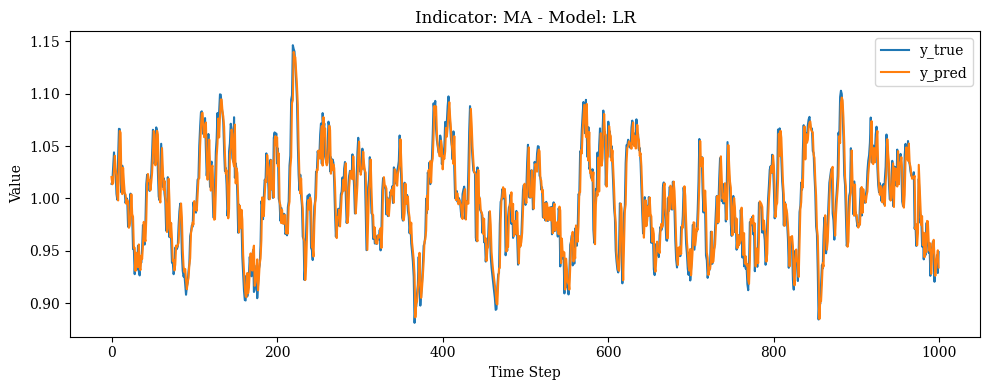

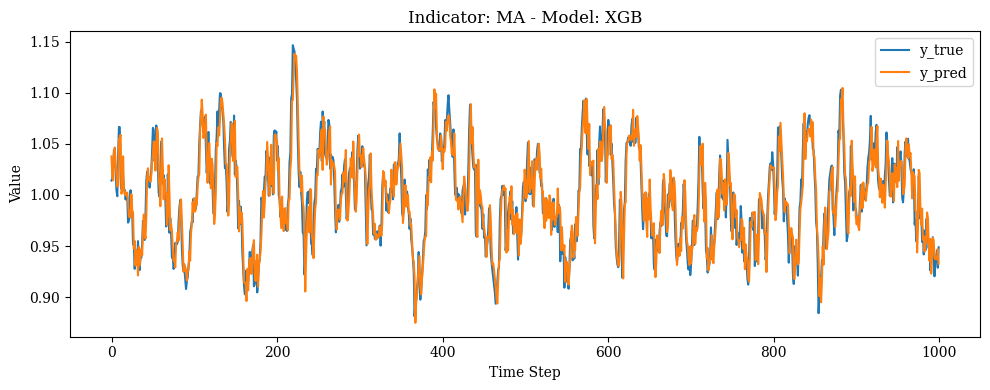

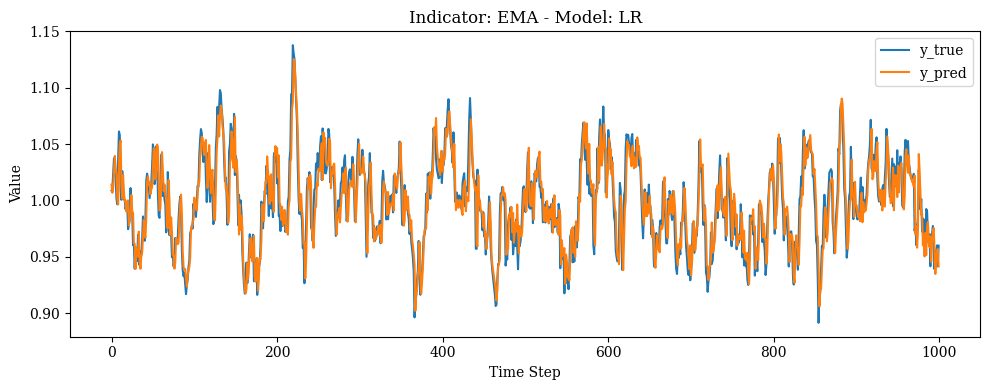

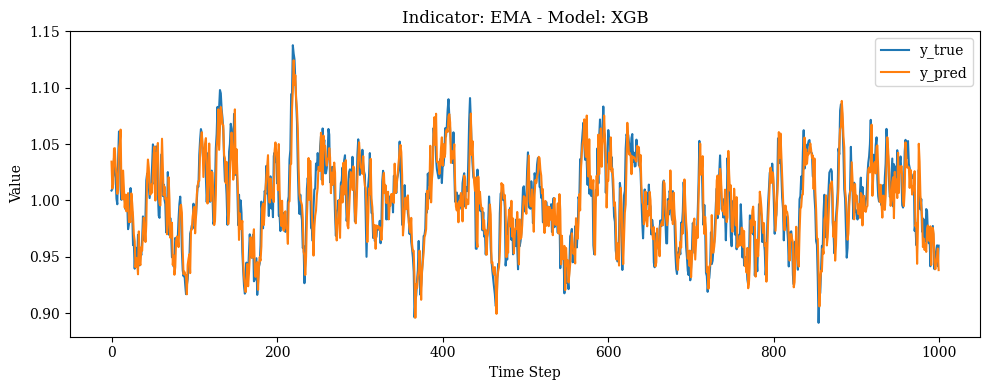

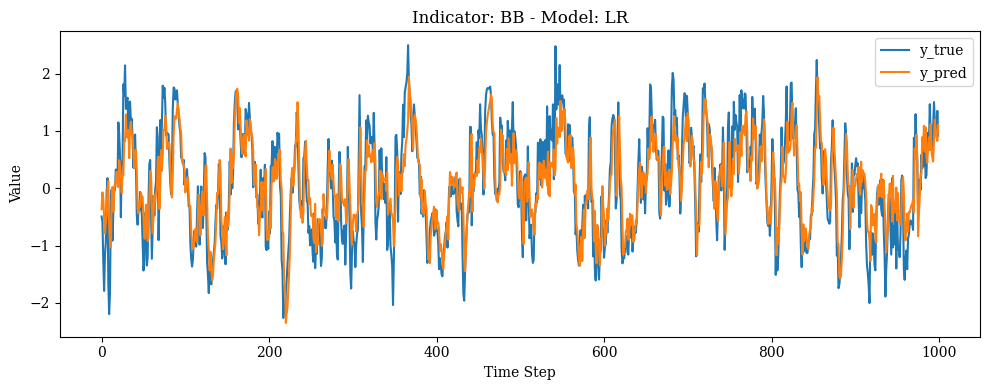

...

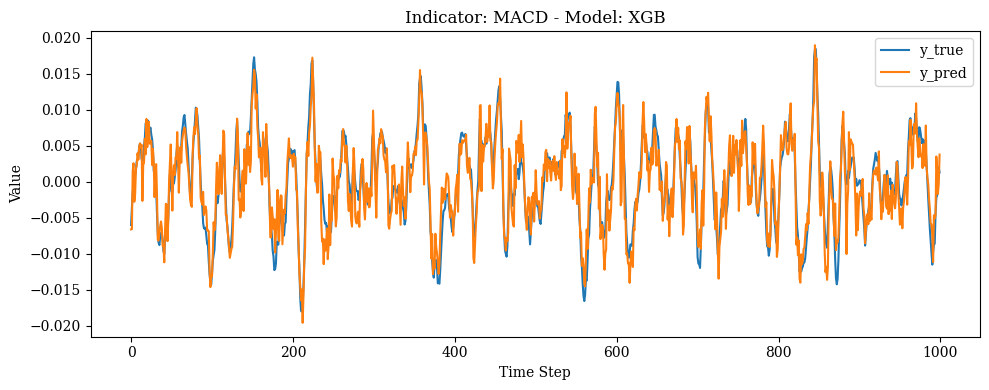

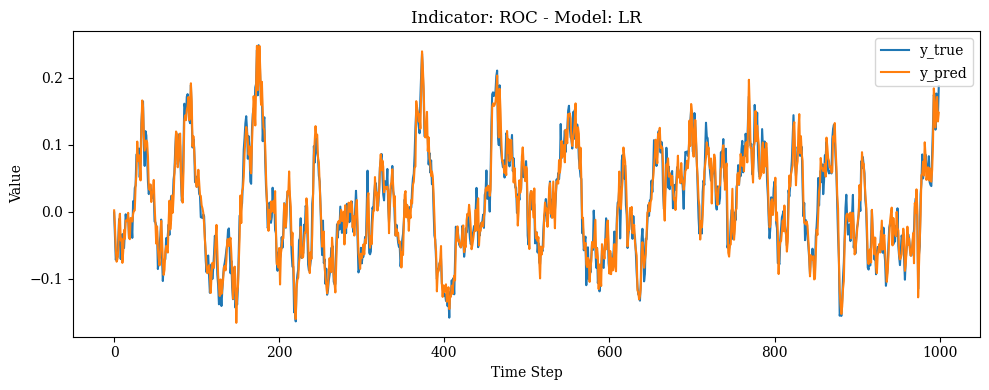

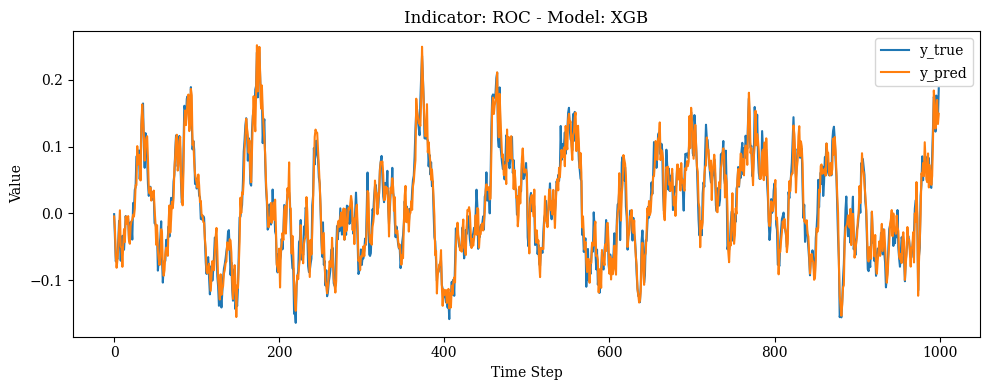

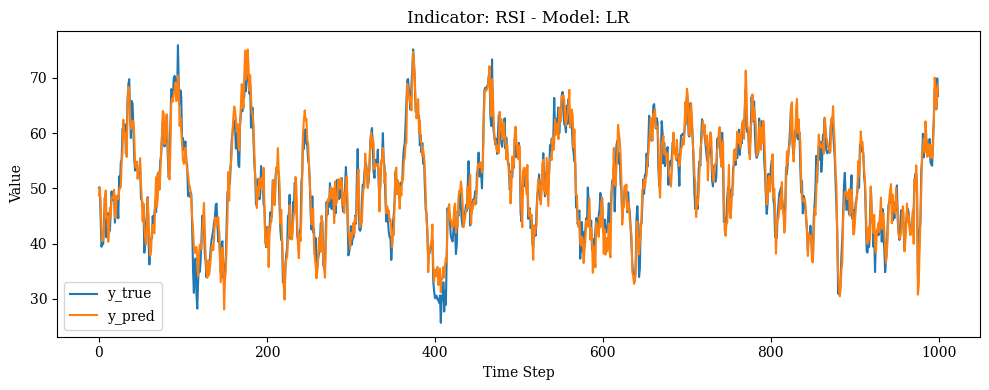

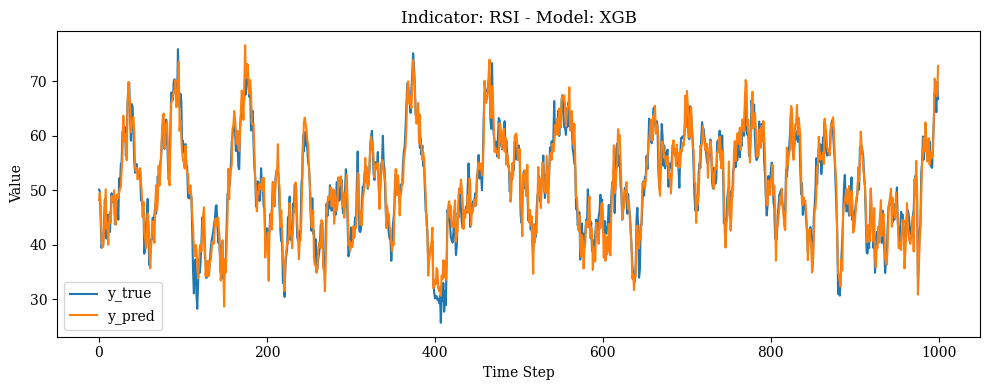

In [14]:
plot_first_N_predictions(TrainedModelsIndicators, 1000)

In [17]:
Train_N = 1000
Test_N = 50

TrainedModelsIndicators = LearnAllIndicators(Train_N, Test_N, trunc_level=3, sig_window=26, time_aug=True)

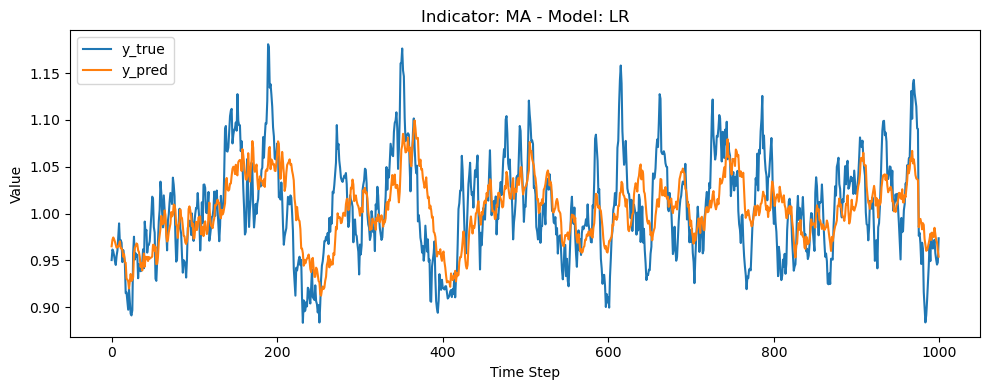

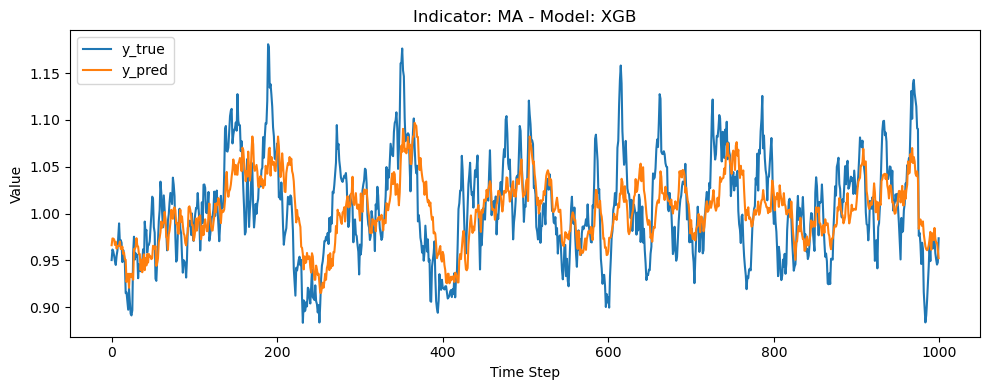

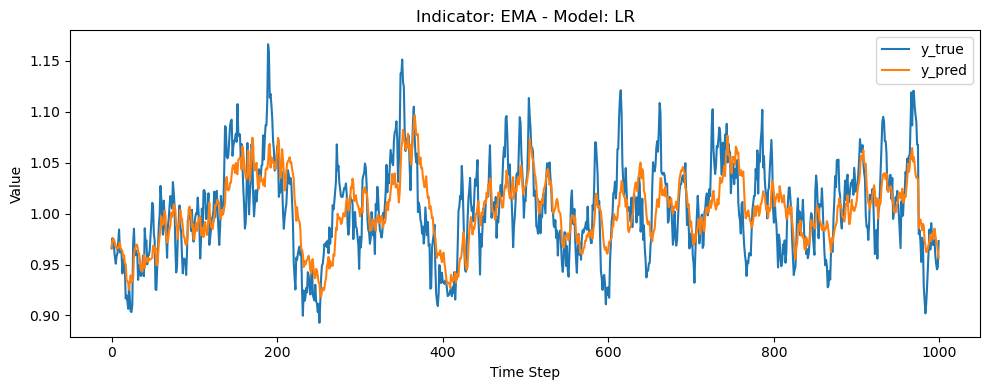

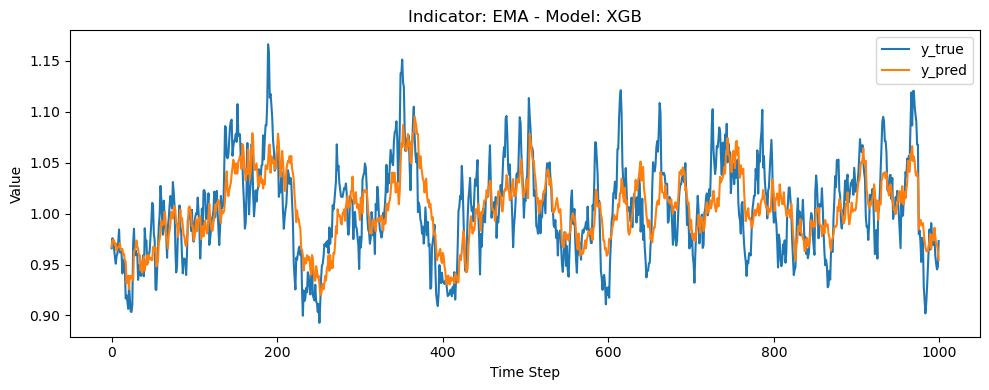

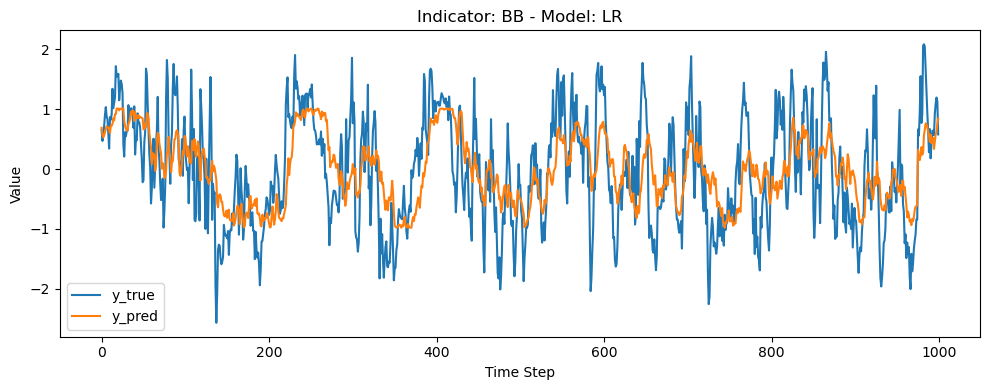

...

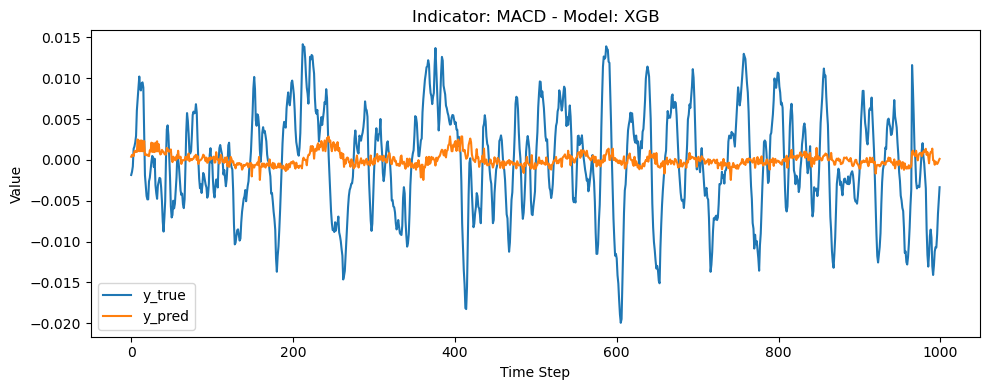

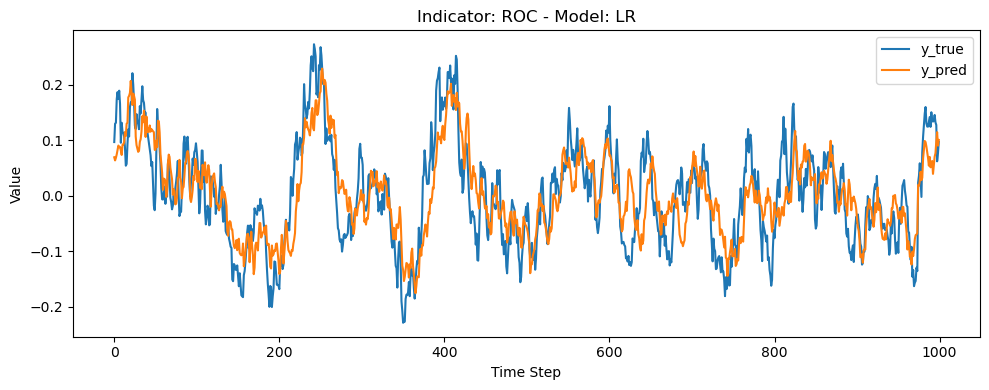

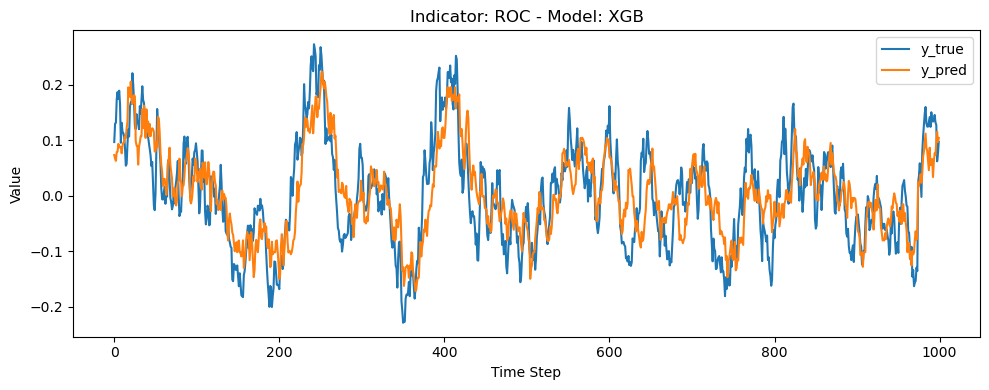

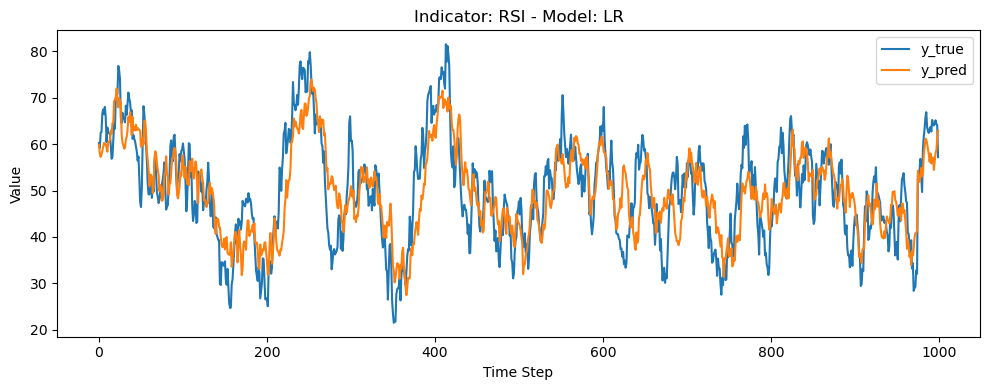

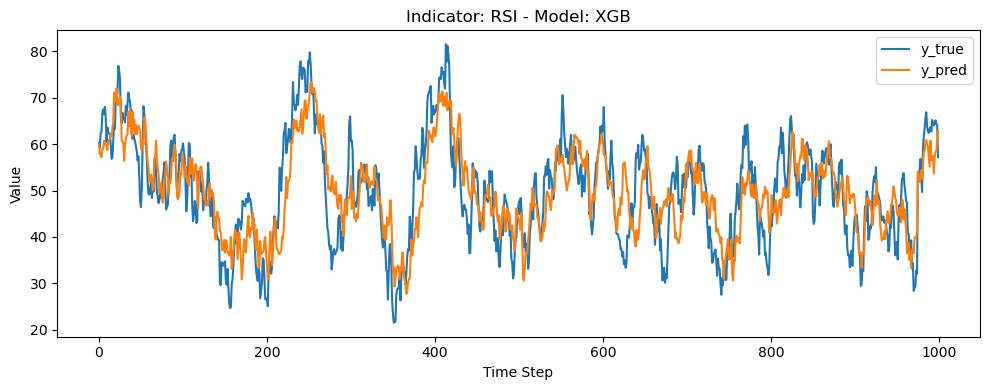

In [18]:
plot_first_N_predictions(TrainedModelsIndicators, 1000)

In [34]:
def evaluate_trunc_levels(Train_N, Test_N, trunc_values, time_aug=True, init_value_aug=True):
    all_results = {}
    
    for trunc in trunc_values:
        print(trunc)
        TrainedModelsIndicators = LearnAllIndicators(Train_N, Test_N, trunc_level=trunc, sig_window=26, time_aug=time_aug, init_value_aug=init_value_aug)
        rmse_result = compute_rmse_std_percentage(TrainedModelsIndicators)

        for indicator, models in rmse_result.items():
            if indicator not in all_results:
                all_results[indicator] = {}
            for model, value in models.items():
                if model not in all_results[indicator]:
                    all_results[indicator][model] = []
                all_results[indicator][model].append(value)
    
    return all_results

def plot_rmse_vs_trunc(all_results, trunc_values):

    indicator_names = ['MA', 'EMA', 'BB', 'MACD', 'ROC', 'RSI']
    fig, axes = plt.subplots(3, 2, figsize=(12, 10), sharey=True, dpi=500)
    handles_labels = {}

    for i, (indicator, model_data) in enumerate(all_results.items()):
        row, col = divmod(i, 2)
        ax = axes[row, col]
        ax.set_facecolor('lightgrey')  # Light grey background

        label = indicator_names[indicator] if isinstance(indicator, int) and indicator < len(indicator_names) else str(indicator)
        ax.set_title(label, fontsize=12, fontweight='bold')
        ax.set_xlabel('Truncation Level')
        ax.set_ylabel('NRMSE (%)')
        ax.grid(color='white', linestyle='--', linewidth=1)
        ax.tick_params(axis='x', which='both', labelbottom=True)
        ax.tick_params(axis='y', which='both', labelleft=True)

        colors = ['red', 'green']
        for idx, (model, rmse_list) in enumerate(model_data.items()):
            color = colors[idx % len(colors)]
            line, = ax.plot(trunc_values, rmse_list, marker='x', label=model, linewidth=1.5, color=color)
            handles_labels[model] = line

    # Shared legend
    fig.legend(handles_labels.values(), handles_labels.keys(), loc='upper center', ncol=len(handles_labels), fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()




1
2
3
4
5
6
7
8
9


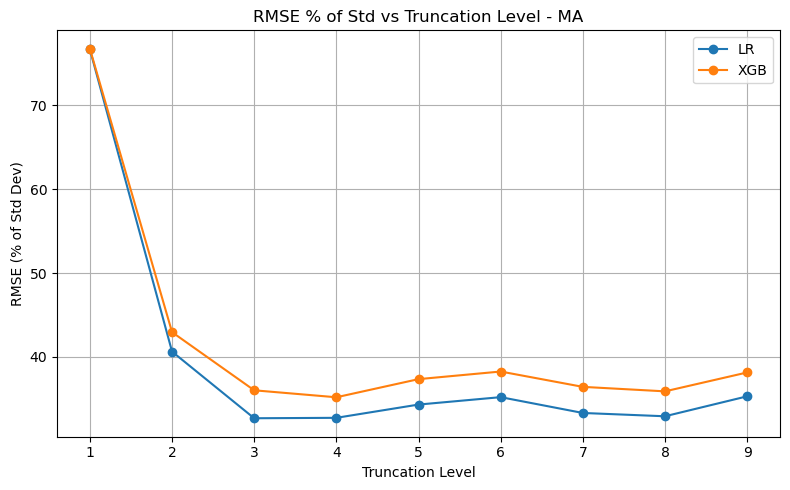

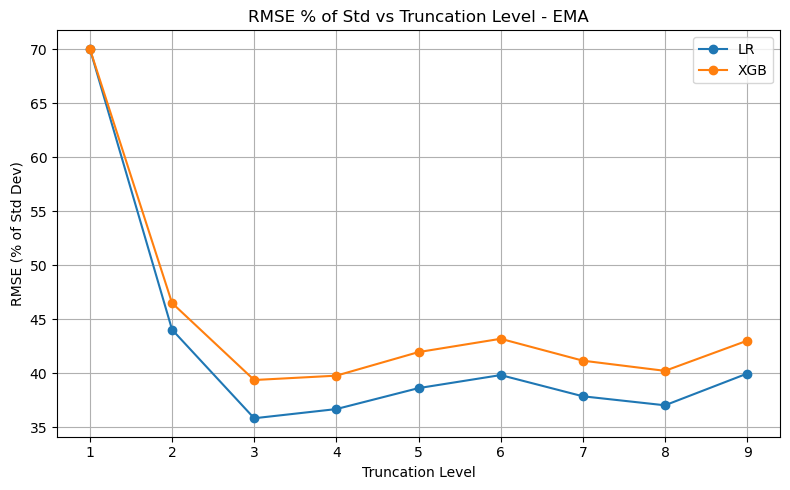

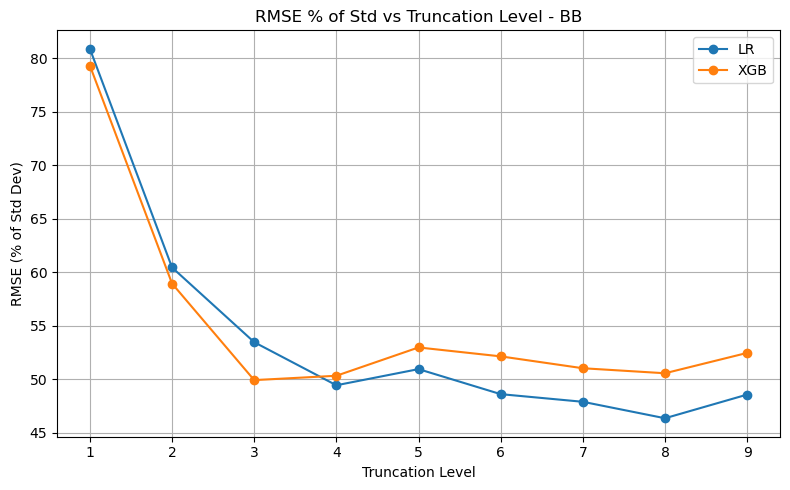

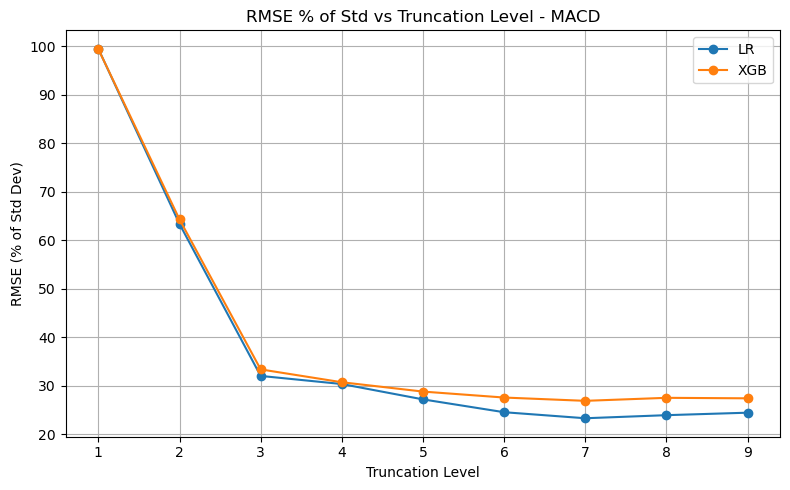

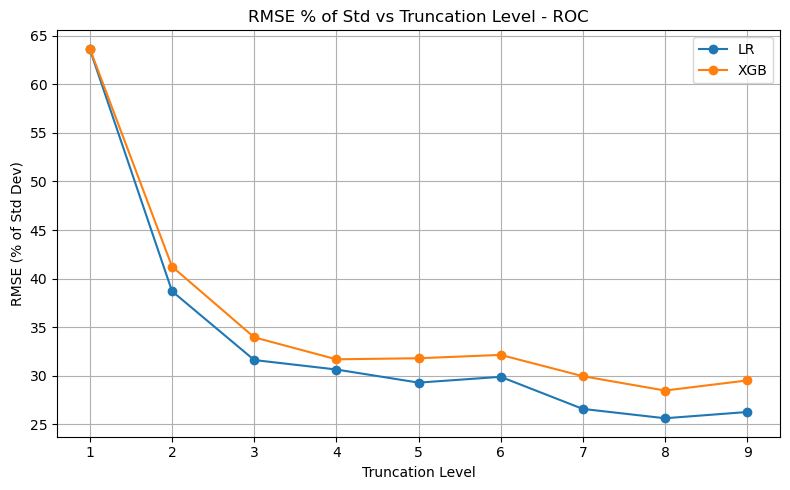

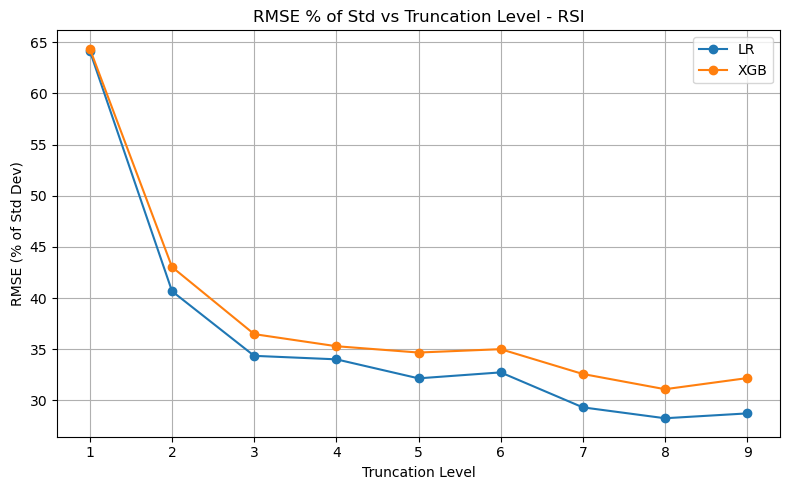

In [42]:
Train_N = 50
Test_N = 10
time_aug = True

trunc_range = range(1, 10)
results = evaluate_trunc_levels(Train_N, Test_N, trunc_range, time_aug)


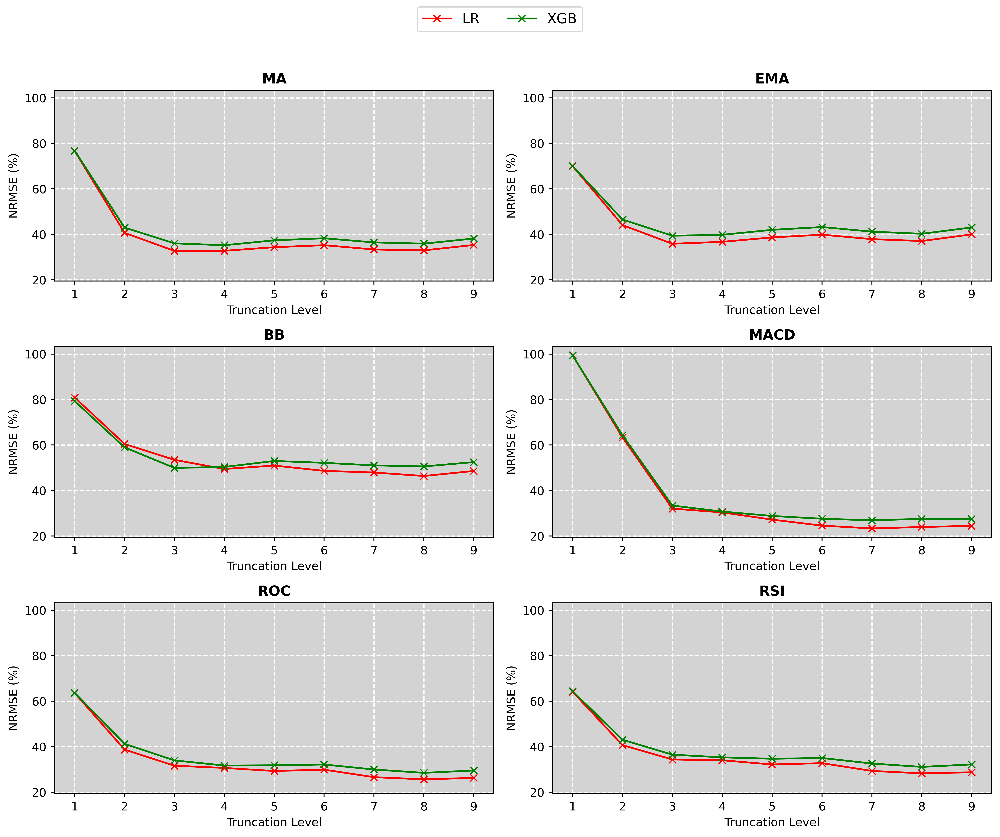

In [98]:
plot_rmse_vs_trunc(results, list(trunc_range))

In [31]:
def plot_lr_comparison(results_true, results_false, trunc_values):
    """
    Overlays LR RMSE % std plots for time_aug True vs False across all indicators in a 3x2 grid.
    
    Parameters:
        results_true, results_false (dict): Outputs from evaluate_trunc_levels for each setting.
        trunc_values (list): List of truncation levels.
    """
    import matplotlib.pyplot as plt

    indicator_names = ['MA', 'EMA', 'BB', 'MACD', 'ROC', 'RSI']
    fig, axes = plt.subplots(3, 2, figsize=(14, 10), dpi=500, sharex=True, sharey=True)
    handles_labels = {}

    for i, indicator in enumerate(results_true):
        if 'LR' in results_true[indicator] and 'LR' in results_false.get(indicator, {}):
            row, col = divmod(i, 2)
            ax = axes[row, col]
            ax.set_facecolor('lightgrey')

            label = indicator_names[indicator] if isinstance(indicator, int) and indicator < len(indicator_names) else str(indicator)

            line1, = ax.plot(trunc_values, results_true[indicator]['LR'], marker='x', label='Time Augmented', color='red', linewidth=2)
            line2, = ax.plot(trunc_values, results_false[indicator]['LR'], marker='x', label='Standard', color='blue', linewidth=2)

            handles_labels['Time Augmented'] = line1
            handles_labels['Standard'] = line2

            ax.set_title(label, fontsize=12, fontweight='bold')
            ax.set_xlabel('Truncation Level')
            ax.set_ylabel('NRMSE (%)')
            ax.grid(color='white', linestyle='--', linewidth=1)
            ax.tick_params(axis='x', labelbottom=True)
            ax.tick_params(axis='y', labelleft=True)

    # Shared legend on top
    fig.legend(handles_labels.values(), handles_labels.keys(), loc='upper center', ncol=2, fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()


In [110]:
Train_N = 100
Test_N = 20
trunc_range = range(1,11)
results_true = evaluate_trunc_levels(Train_N, Test_N, trunc_range, time_aug=True)
results_false = evaluate_trunc_levels(Train_N, Test_N, trunc_range, time_aug=False)


1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10


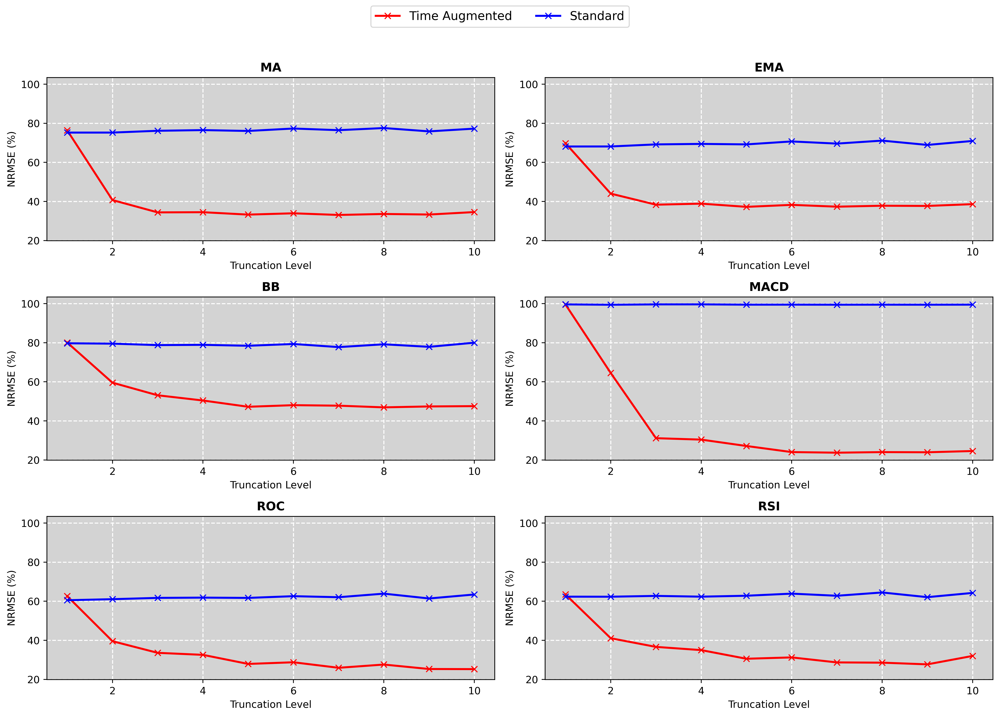

In [111]:
plot_lr_comparison(results_true, results_false, list(trunc_range))

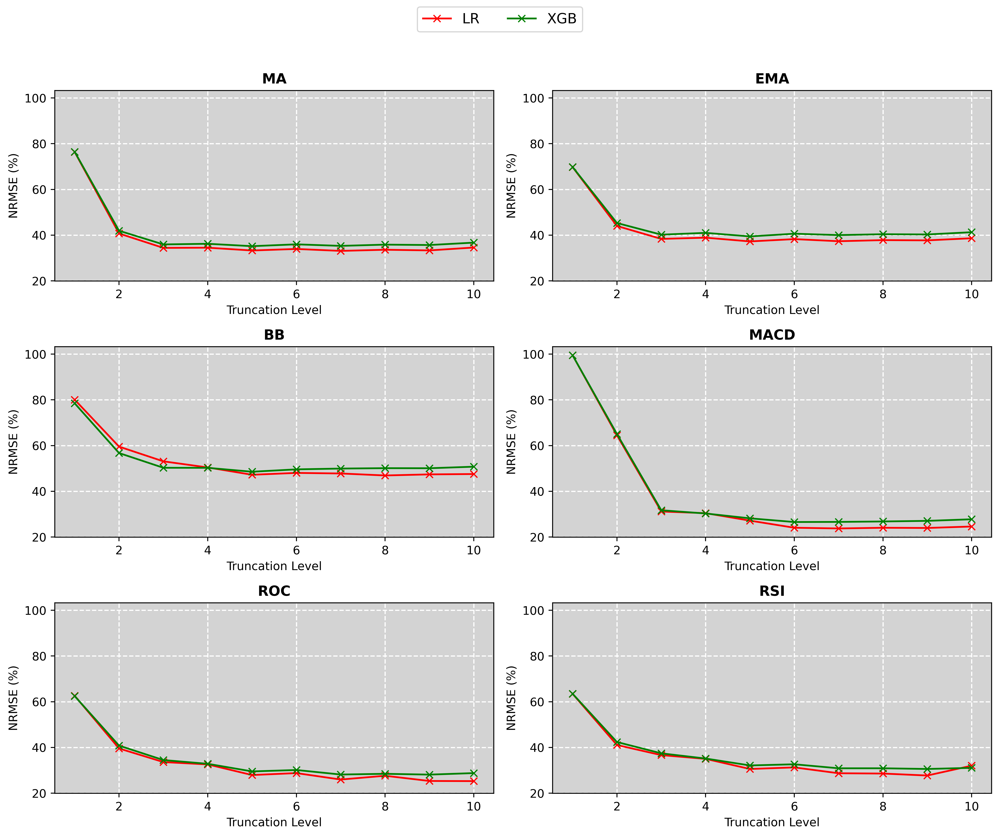

In [112]:
plot_rmse_vs_trunc(results_true, list(trunc_range))

In [113]:
def build_time_aug_comparison_table(results_true, results_false):
    """
    Constructs a DataFrame comparing NRMSE (%) for LR and XGB models across indicators,
    with and without time augmentation, using the highest truncation level.

    Parameters:
        results_true (dict): Output from evaluate_trunc_levels with time_aug=True
        results_false (dict): Output from evaluate_trunc_levels with time_aug=False

    Returns:
        pd.DataFrame: Table with indicators as rows, and grouped columns:
                      Time Augmentation -> LR / XGB
                      Standard          -> LR / XGB
    """
    indicator_names = ['MA', 'EMA', 'BB', 'MACD', 'ROC', 'RSI']
    models_to_include = ['LR', 'XGB']
    data = []

    for i, name in enumerate(indicator_names):
        row = []
        for source in [results_true, results_false]:  # Time Augmented, then Standard
            for model in models_to_include:
                try:
                    values = source[i][model]
                    last_value = values[-1] if values else None  # Last value = highest trunc level
                    row.append(round(last_value, 3))
                except (KeyError, IndexError):
                    row.append(None)
        data.append(row)

    columns = pd.MultiIndex.from_product(
        [['Time Augmentation', 'Standard'], ['LR', 'XGB']],
        names=['Setting', 'Model']
    )

    df = pd.DataFrame(data, index=indicator_names, columns=columns)
    return df


In [104]:
build_time_aug_comparison_table(results_true, results_false)

Setting Time Augmentation         Standard        
Model                  LR     XGB       LR     XGB
MA                 32.174  34.812   77.098  77.392
EMA                36.153  39.180   70.029  70.454
BB                 45.937  50.297   77.926  78.766
MACD               23.577  26.556   99.286  99.393
ROC                24.395  27.637   62.102  62.412
RSI                27.134  30.097   62.858  63.382

In [39]:
Train_N = 50
Test_N = 20
trunc_range = range(1,5)
results_false = evaluate_trunc_levels(Train_N, Test_N, trunc_range, time_aug=False, init_value_aug=False)

results_true = evaluate_trunc_levels(Train_N, Test_N, trunc_range, time_aug=True, init_value_aug=False)


1
2
3
4
1
2
3
4


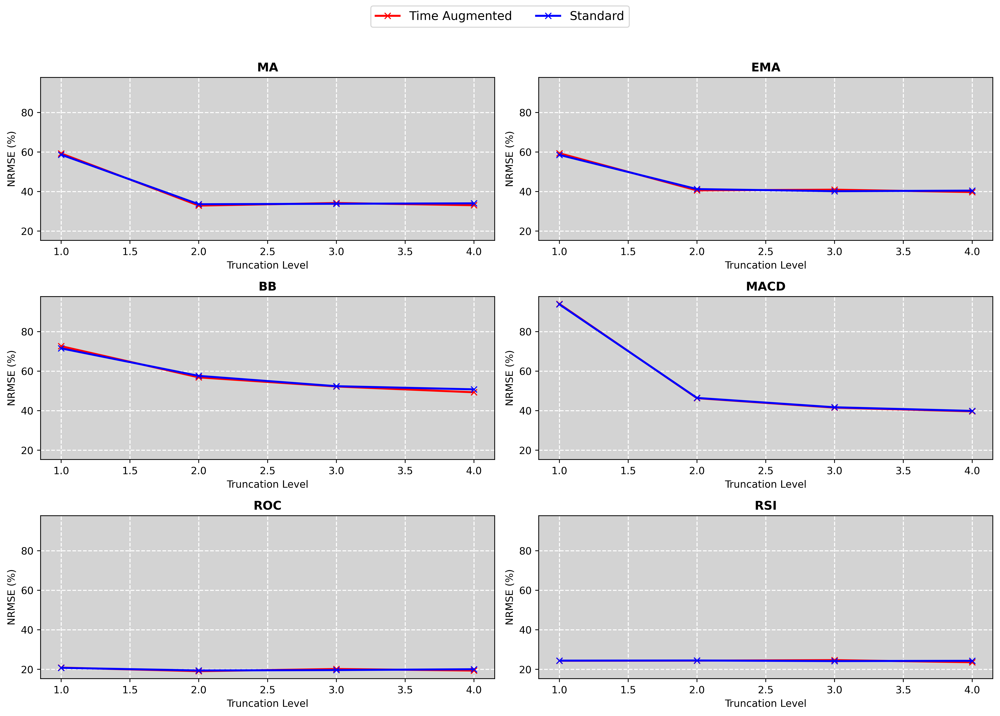

In [40]:
plot_lr_comparison(results_true, results_false, list(trunc_range))

In [365]:



RMSE, R2, TrainedModels, Data = LearnIndicator(Train_N, Test_N, trunc_level=3, sig_window=40, indicator_no=3, lasso_alpha=0.1, time_aug=True)

X_raw_train, X_raw_test, X_train, X_test, Y_train, Y_test = Data

In [366]:
X_train.shape, Y_train.shape

((96500, 14), (96500,))

In [367]:
X_train[0]

array([ 3.77894877e-02,  1.00000000e+00,  7.14022691e-04, -4.17237948e-02,
        7.95132825e-02,  5.00000000e-01,  8.99418391e-06,  1.64198257e-03,
       -4.86068597e-03, -2.66624043e-02,  3.93272609e-03,  1.16010138e-02,
        3.39561343e-02,  1.66666667e-01])

In [368]:
Y_train[0]

0.007025139191150949

In [369]:
import math

In [370]:
[((np.log(X_raw_train[0][:25])[-1] - np.log(X_raw_train[0][:25])[0])**i)/math.factorial(i) for i in range(1, 10)]

[-0.09031346673765395,
 0.004078261137086663,
 -0.00012277396718391438,
 2.772035650378567e-06,
 -5.0070429901211126e-08,
 7.536723509038441e-10,
 -9.72382325634911e-12,
 1.0977402352813891e-13,
 -1.1015636247296684e-15]

In [371]:
Y_test[0]

-0.006527496671070704

In [372]:
def VisualiseResults(trained_model, X_test, Y_test, Test_N):
        
    # Predictions
    Y_pred = trained_model.predict(X_test)
    
    Y_true_formatted = Y_test.reshape(Test_N, len(Y_test)//Test_N)
    Y_pred_formatted = Y_pred.reshape(Test_N, len(Y_test)//Test_N)

    for i in range(1):
        plt.plot(Y_true_formatted[i], label='true')
        plt.plot(Y_pred_formatted[i], label= 'pred')
        plt.legend()
        plt.show()

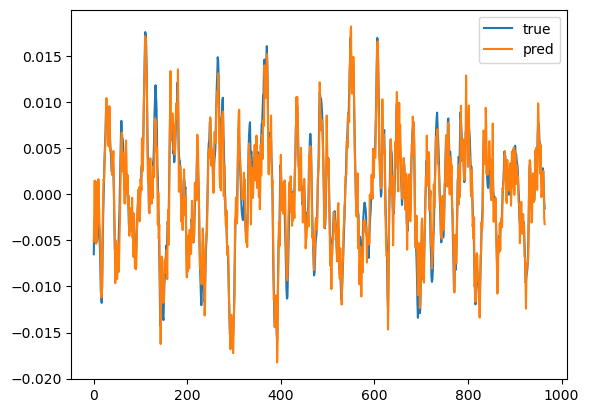

In [374]:
VisualiseResults(TrainedModels['LR'], X_test, Y_test, Test_N)

In [377]:
RMSE, R2, TrainedModels

({'LR': 0.0021511887345545227,
  'Lasso': 0.006808946401385527,
  'XGB': 0.0021685803357587097},
 {'LR': 0.9001840978031954,
  'Lasso': -5.843507382419233e-06,
  'XGB': 0.8985636210481813},
 {'LR': LinearRegression(),
  'Lasso': Lasso(alpha=0.1),
  'XGB': XGBRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=500, n_jobs=None,
               num_parallel_tree=None, ra

# Generate plots for RMSE against truncation level for each indicator and model

In [337]:
from collections import defaultdict


1
2
3
4


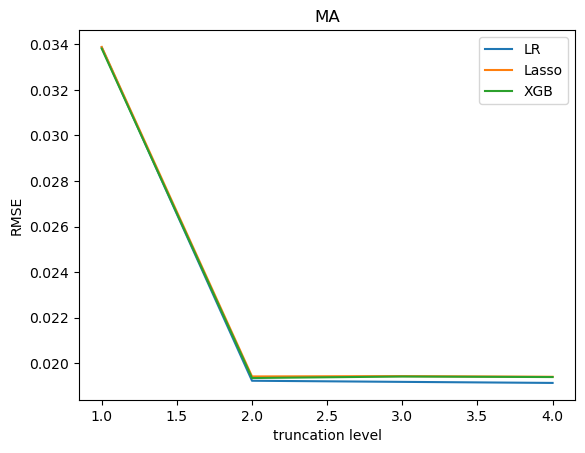

1
2
3
4


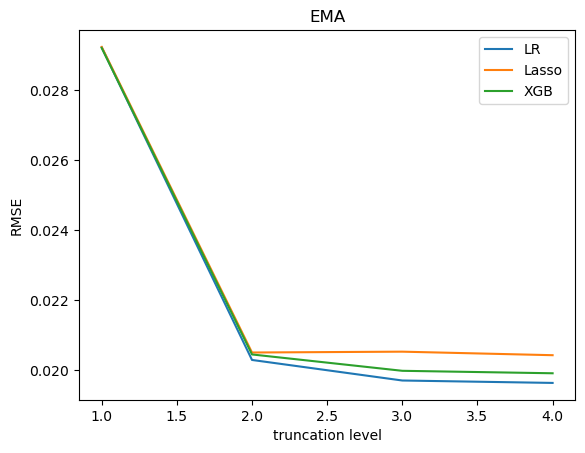

1
2
3


KeyboardInterrupt: 

In [341]:
indicators = ['MA', 'EMA', 'BB', 'MACD', 'ROC', 'RSI']
trunc_levels = list(range(1, 5))

Train_N, Test_N = 500, 50

for i, indicator_name in enumerate(indicators):
    
    error_list = defaultdict(list)
    
    for trunc_level in trunc_levels:
        print(trunc_level)
        
        RMSE, R2, TrainedModels, Data = LearnIndicator(Train_N, Test_N, trunc_level=trunc_level, sig_window=26, indicator_no=i, lasso_alpha=0.0001, time_aug=True)
        
        for key, value in RMSE.items():
            error_list[key].append(value)
            
    for key, value in error_list.items():
        plt.plot(trunc_levels, value, label=key)
        plt.xlabel('truncation level')
        plt.ylabel('RMSE')
        plt.legend()
        
    plt.title(indicator_name)   
    plt.show()
        
        

In [ ]:
# with position augmentation and bias term:

In [ ]:
indicators = ['MA', 'EMA', 'BB', 'MACD', 'ROC', 'RSI']
trunc_levels = list(range(1, 6))

Train_N, Test_N = 500, 50

for i, indicator_name in enumerate(indicators):
    
    error_list = defaultdict(list)
    
    for trunc_level in trunc_levels:
        print(trunc_level)
        
        RMSE, R2, TrainedModels, Data = LearnIndicator(Train_N, Test_N, trunc_level=trunc_level, sig_window=26, indicator_no=i, lasso_alpha=0.1, translation_aug=True, log=True)
        
        for key, value in RMSE.items():
            error_list[key].append(value)
            
    for key, value in error_list.items():
        plt.plot(trunc_levels, value, label=key)
        plt.xlabel('truncation level')
        plt.ylabel('RMSE')
        plt.legend()
        
    plt.title(indicator_name)   
    plt.show()
        
        

In [572]:
Train_N = 500
Test_N = 50

trunc_level = 10
window = 26

X_raw_train, X_raw_test, X_train, X_test, Y_train, Y_test = CreateTrainTestData(Train_N, Test_N, trunc_level, window, indicator_no=4, translation_aug=True)

In [ ]:
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.metrics import mean_squared_error, r2_score

In [590]:
# Initialize and fit Linear Regression model
model = Lasso(alpha=0.1)
model.fit(X_train, Y_train)

# Predictions
Y_pred = model.predict(X_test)


# Compute performance metrics
rmse = mean_squared_error(Y_test, Y_pred, squared=False)
r2 = r2_score(Y_test, Y_pred)

# Output results
print(f"RMSE: {rmse}")
print(f"R² Score: {r2}")

RMSE: 0.042281021144173994
R² Score: 0.8354043512119438


C:\Users\prane\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.115e+02, tolerance: 5.157e-01
  model = cd_fast.enet_coordinate_descent(


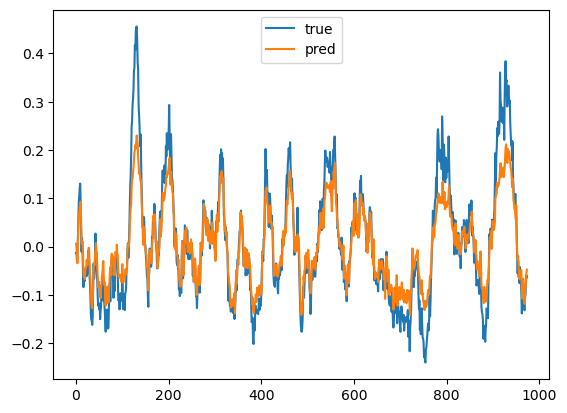

In [591]:
Y_true_formatted = Y_test.reshape(Test_N, len(Y_test)//Test_N)
Y_pred_formatted = Y_pred.reshape(Test_N, len(Y_test)//Test_N)

plt.plot(Y_true_formatted[2], label='true')
plt.plot(Y_pred_formatted[2], label= 'pred')
plt.legend()
plt.show()

Non-linear model: XGBoost

In [575]:
import xgboost as xgb

In [576]:
random_state = 128

# regression model
model = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=500, random_state=random_state)

# Train the model
model.fit(X_train, Y_train)

# Predictions
Y_pred = model.predict(X_test)

# Compute performance metrics
rmse = mean_squared_error(Y_test, Y_pred, squared=False)
r2 = r2_score(Y_test, Y_pred)

# Output results
print(f"RMSE: {rmse}")
print(f"R² Score: {r2}")


RMSE: 0.02070202374348393
R² Score: 0.9605403690013108


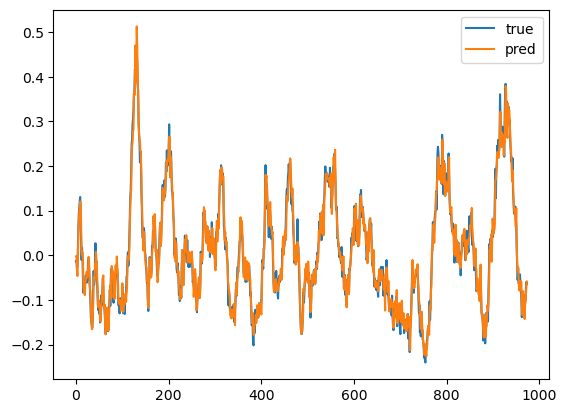

In [577]:
Y_true_formatted = Y_test.reshape(Test_N, len(Y_test)//Test_N)
Y_pred_formatted = Y_pred.reshape(Test_N, len(Y_test)//Test_N)

plt.plot(Y_true_formatted[2], label='true')
plt.plot(Y_pred_formatted[2], label= 'pred')
plt.legend()
plt.show()

Non-linear Model: NN

In [459]:
import torch
import torch.nn as nn
import torch.optim as optim


# Convert to PyTorch tensors
X_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_tensor = torch.tensor(Y_train, dtype=torch.float32).view(-1, 1)  # Reshape for PyTorch

# standardise
mu, sigma = X_tensor.mean(axis=0), X_tensor.std(axis=0)

X_tensor = (X_tensor - mu)/sigma

# Define a simple neural network model
class NeuralNetwork(nn.Module):
    def __init__(self, input_size):
        super(NeuralNetwork, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        return x

# Initialize model
input_size = X_train.shape[1]  # Number of features
model = NeuralNetwork(input_size)

# Loss function & optimizer
criterion = nn.MSELoss()

In [460]:
optimizer = optim.Adam(model.parameters(), lr=0.1)

# Training loop
epochs = 100
for epoch in range(epochs):
    
    if epoch > 50:
        optimizer = optim.Adam(model.parameters(), lr=0.01)
    #if epoch > 100:
    #    optimizer = optim.Adam(model.parameters(), lr=0.001)
    #if epoch > 200:
    #    optimizer = optim.Adam(model.parameters(), lr=0.0001)
    
    model.train()
    optimizer.zero_grad()
    
    # Forward pass
    predictions = model(X_tensor)
    loss = criterion(predictions, Y_tensor)
    
    # Backward pass
    loss.backward()
    optimizer.step()
    
    if epoch % 10 == 0:
        print(f"Epoch {epoch}/{epochs}, Loss: {loss.item()}")

Epoch 0/100, Loss: 2742.8388671875
Epoch 10/100, Loss: 175.89239501953125
Epoch 20/100, Loss: 52.37269973754883
Epoch 30/100, Loss: 31.920373916625977
Epoch 40/100, Loss: 25.22691535949707
Epoch 50/100, Loss: 22.331281661987305
Epoch 60/100, Loss: 73.85584259033203
Epoch 70/100, Loss: 73.78984832763672
Epoch 80/100, Loss: 73.74309539794922
Epoch 90/100, Loss: 73.70279693603516


insample

In [ ]:
# Evaluate the model
model.eval()
with torch.no_grad():
    Y_pred_tensor = model(X_tensor)
    
# Convert back to NumPy for metrics
Y_pred = Y_pred_tensor.numpy().flatten()
Y_true = Y_train.flatten()

# Compute performance metrics
rmse = mean_squared_error(Y_true, Y_pred, squared=False)
r2 = r2_score(Y_true, Y_pred)

# Output results
print(f"Final RMSE: {rmse}")
print(f"Final R² Score: {r2}")

outofsample

In [ ]:
X_tensor_test = torch.tensor(X_test, dtype=torch.float32)
X_tensor_test = (X_tensor_test - mu)/sigma

Y_tensor_test = torch.tensor(Y_test, dtype=torch.float32).view(-1, 1)  # Reshape for PyTorch

# Evaluate the model
model.eval()
with torch.no_grad():
    Y_pred_tensor = model(X_tensor_test)
    
# Convert back to NumPy for metrics
Y_pred = Y_pred_tensor.numpy().flatten()
Y_true = Y_test.flatten()

# Compute performance metrics
rmse = mean_squared_error(Y_true, Y_pred, squared=False)
r2 = r2_score(Y_true, Y_pred)

# Output results
print(f"Final RMSE: {rmse}")
print(f"Final R² Score: {r2}")

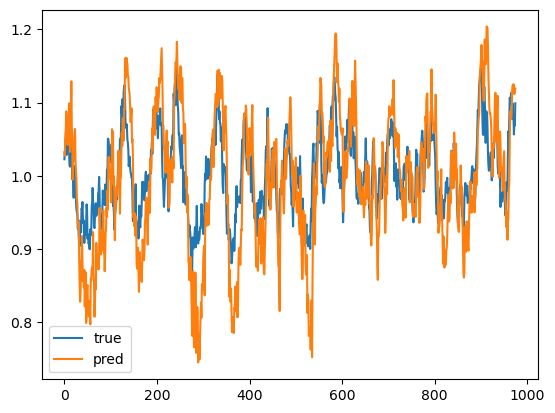

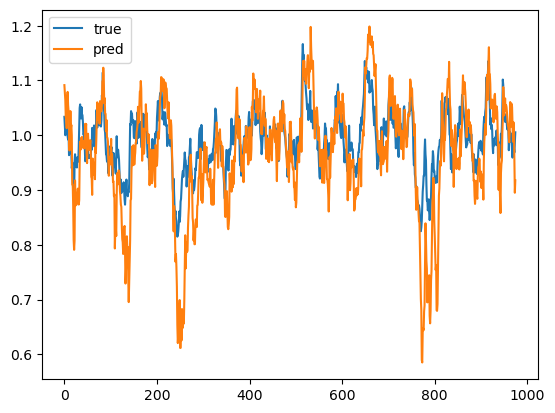

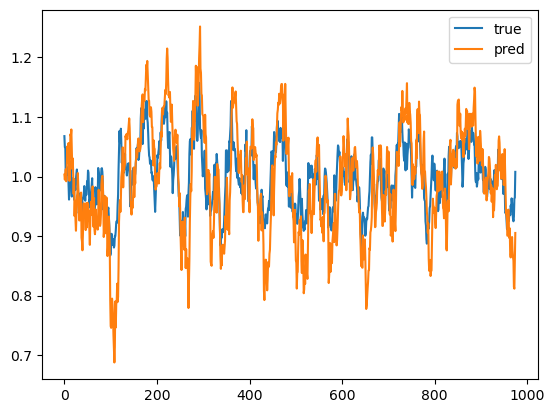

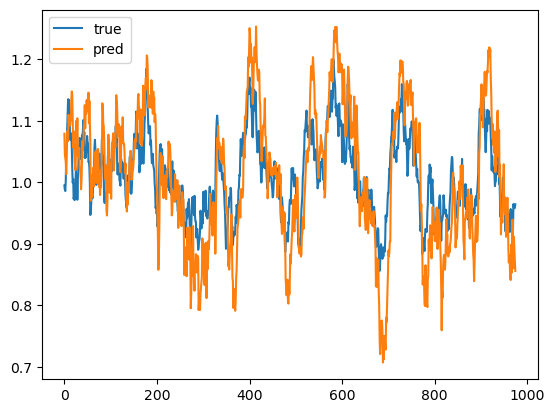

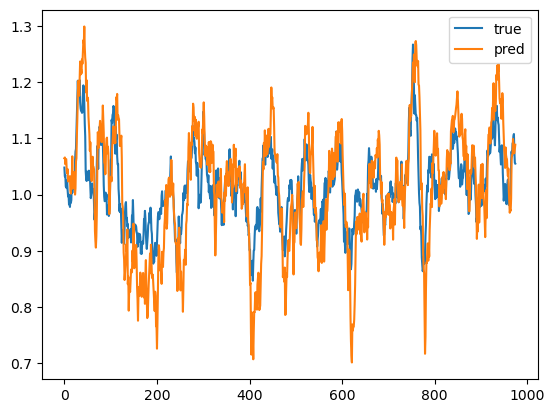

...

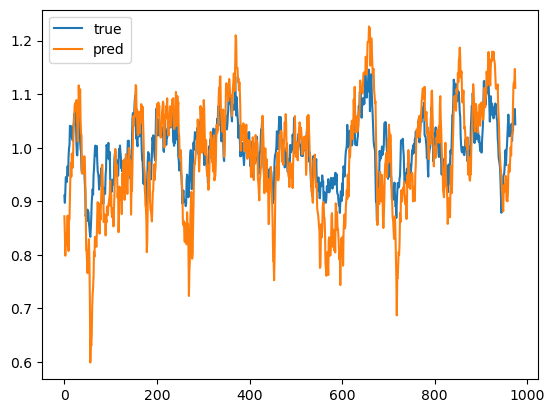

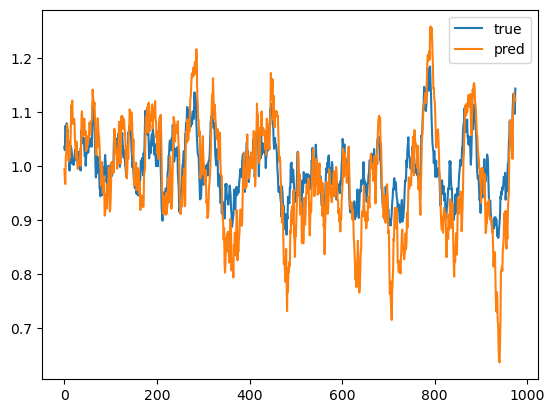

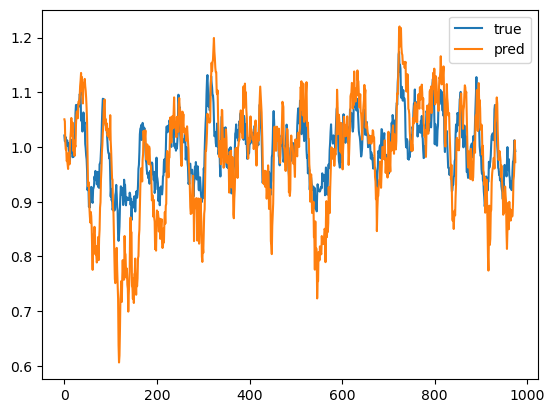

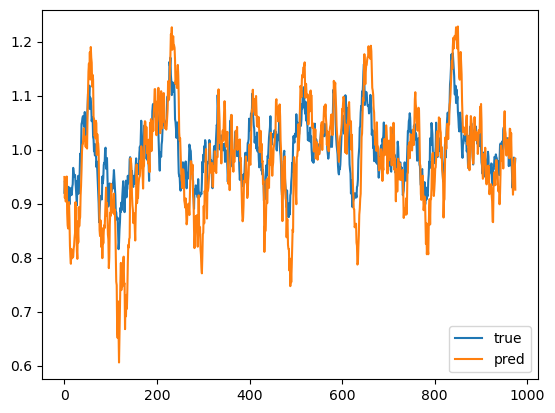

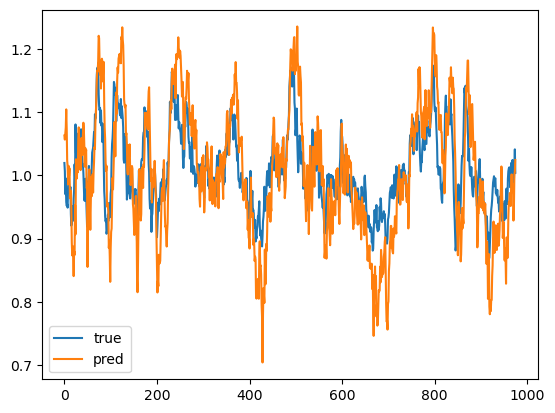

In [522]:
Y_true_formatted = Y_test.reshape(Test_N, 975)
Y_pred_formatted = Y_pred.reshape(Test_N, 975)

for i in range(Test_N):

    plt.plot(Y_true_formatted[i], label='true')
    plt.plot(1 - Y_pred_formatted[i], label= 'pred')
    plt.legend()
    plt.show()